<a href="https://colab.research.google.com/github/arik08/sharecode/blob/master/MG_CO2_FFT_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import pandas as pd
df = pd.read_excel('/content/drive/My Drive/Data_for_Analysis/190902-9_pressure.xlsx',sheet_name='Sheet')

In [0]:
df.head()

,날짜,D-Temp,CO2,Oxy,DB-Oxy,P41366-INP,P41381-INP,P41385-INP,P41386-INP,P41390-INP,P41394-INP,P41367-INP,P41375-INP,P41382-INP,P41387-INP,P41391-INP,P41395-INP,P41398-INP,P41368-INP,P41377-INP,P41383-INP,P41388-INP,P41392-INP,P41396-INP,P41369-INP,P41379-INP,P41384-INP,P41389-INP,P41393-INP,P41397-INP,P41398-INP.1
0,2019-09-02 00:00:00,1100.206,12.9,79387.546,27426.37,4.7,4.49,4.44,4.55,4.43,4.37,4.7,4.6,4.44,4.41,4.40,4.39,4.31,4.50,4.6,4.44,4.39,4.40,4.38,4.57,4.6,4.41,4.45,4.38,4.37,4.31
1,2019-09-02 00:01:00,1090.646,12.9,78368.296,27474.21,4.7,4.46,4.45,4.55,4.42,4.35,4.7,4.6,4.47,4.41,4.39,4.37,4.32,4.51,4.6,4.42,4.38,4.38,4.36,4.55,4.6,4.41,4.45,4.38,4.37,4.32
2,2019-09-02 00:02:00,1081.648,13.0,78139.734,27532.11,4.7,4.48,4.46,4.55,4.41,4.35,4.7,4.6,4.48,4.41,4.40,4.37,4.30,4.52,4.6,4.43,4.38,4.39,4.36,4.56,4.6,4.41,4.44,4.38,4.37,4.30
3,2019-09-02 00:03:00,1080.805,12.7,77967.476,27501.24,4.7,4.50,4.50,4.55,4.42,4.35,4.7,4.6,4.51,4.41,4.41,4.38,4.31,4.56,4.6,4.44,4.38,4.39,4.37,4.58,4.6,4.43,4.44,4.37,4.37,4.31
4,2019-09-02 00:04:00,1075.887,12.5,78031.625,27470.35,4.7,4.55,4.56,4.55,4.42,4.37,4.7,4.6,4.55,4.42,4.43,4.39,4.33,4.61,4.6,4.49,4.39,4.40,4.38,4.63,4.6,4.50,4.44,4.37,4.38,4.33


P41366-INP	15.6	1F	0
P41381-INP	17.1	2F	0
P41385-INP	18.0	3F	0
P41386-INP	19.9	4F	0
P41390-INP	20.9	5F	0
P41394-INP	22.4	6F	0
P41367-INP	15.6	1F	90
P41375-INP	17.1	2F	90
P41382-INP	18.0	3F	90
P41387-INP	19.9	4F	90
P41391-INP	20.9	5F	90
P41395-INP	22.4	6F	90
P41398-INP	26.9	7F	all
P41368-INP	15.6	1F	180
P41377-INP	17.1	2F	180
P41383-INP	18.0	3F	180
P41388-INP	19.9	4F	180
P41392-INP	20.9	5F	180
P41396-INP	22.4	6F	180
P41369-INP	15.6	1F	270
P41379-INP	17.1	2F	270
P41384-INP	18.0	3F	270
P41389-INP	19.9	4F	270
P41393-INP	20.9	5F	270
P41397-INP	22.4	6F	270
P41398-INP	26.9	7F	all

In [0]:
df.describe()

,D-Temp,CO2,Oxy,DB-Oxy,P41366-INP,P41381-INP,P41385-INP,P41386-INP,P41390-INP,P41394-INP,P41367-INP,P41375-INP,P41382-INP,P41387-INP,P41391-INP,P41395-INP,P41398-INP,P41368-INP,P41377-INP,P41383-INP,P41388-INP,P41392-INP,P41396-INP,P41369-INP,P41379-INP,P41384-INP,P41389-INP,P41393-INP,P41397-INP,P41398-INP.1
count,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000,10081.000000
mean,1025.936882,13.694981,82442.685288,28779.816713,4.688811,4.621685,4.607959,4.543043,4.521999,4.457742,4.688811,4.589049,4.599712,4.531605,4.516538,4.475202,4.375234,4.667243,4.589049,4.587629,4.517129,4.507941,4.457280,4.690597,4.589049,4.573445,4.527249,4.453352,4.468054,4.375234
std,57.410295,2.356831,4780.944644,2673.173466,0.229063,0.240702,0.240030,0.233173,0.232764,0.228584,0.229063,0.224190,0.239420,0.233053,0.233767,0.229307,0.222994,0.240631,0.224190,0.238893,0.233494,0.232087,0.228117,0.239210,0.224190,0.236950,0.229236,0.225748,0.228533,0.222994
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1014.502000,12.600000,81332.812000,26896.140000,4.700000,4.590000,4.580000,4.530000,4.500000,4.440000,4.700000,4.600000,4.570000,4.510000,4.490000,4.450000,4.350000,4.640000,4.600000,4.560000,4.490000,4.480000,4.430000,4.660000,4.600000,4.550000,4.500000,4.420000,4.450000,4.350000
50%,1030.347000,13.800000,83416.500000,28625.160000,4.700000,4.650000,4.630000,4.560000,4.550000,4.500000,4.700000,4.600000,4.620000,4.560000,4.550000,4.510000,4.420000,4.690000,4.600000,4.610000,4.550000,4.540000,4.490000,4.710000,4.600000,4.600000,4.550000,4.480000,4.510000,4.420000
75%,1044.433000,15.300000,84623.453000,31445.520000,4.700000,4.690000,4.670000,4.600000,4.580000,4.510000,4.700000,4.600000,4.670000,4.590000,4.580000,4.530000,4.430000,4.730000,4.600000,4.650000,4.580000,4.570000,4.510000,4.750000,4.600000,4.640000,4.580000,4.500000,4.520000,4.430000
max,1156.149000,19.800000,87107.546000,32688.450000,4.700000,4.850000,4.850000,4.770000,4.720000,4.640000,4.700000,4.600000,4.900000,4.710000,4.710000,4.650000,4.520000,4.890000,4.600000,4.880000,4.730000,4.730000,4.640000,4.920000,4.600000,4.820000,4.710000,4.620000,4.610000,4.520000


In [0]:
co2 = df['CO2']
co2.describe()

count    10081.000000
mean        13.694981
std          2.356831
min          0.000000
25%         12.600000
50%         13.800000
75%         15.300000
max         19.800000
Name: CO2, dtype: float64

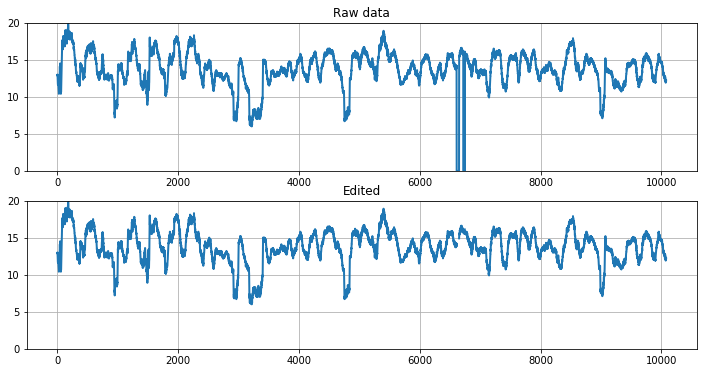

In [0]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,6)
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.color'] = 'r'
plt.rcParams['axes.grid'] = True

plt.subplot(2,1,1)
plt.plot(co2)
plt.ylim(0,20)
plt.title('Raw data')
co2_filter = df.where(df['CO2']>5)

plt.subplot(2,1,2)
plt.plot(co2_filter['CO2'])
plt.ylim(0,20)
plt.title('Edited')
plt.show()

In [0]:
import numpy as np
from scipy.fftpack import fft, ifft

Total 68 hours data presented


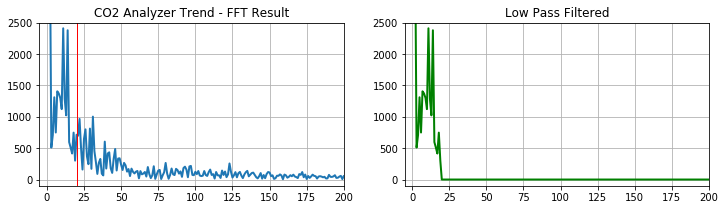

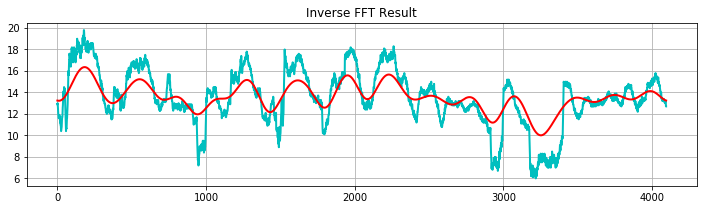

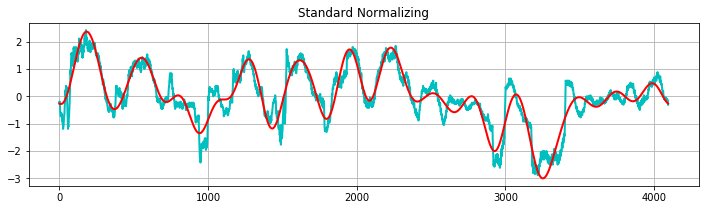

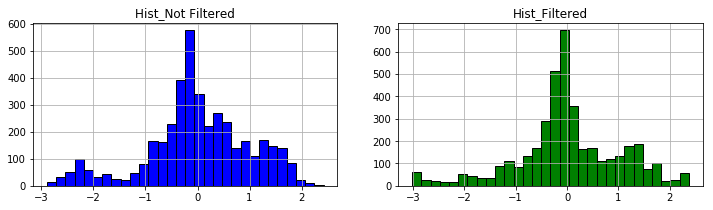

In [0]:
co2_numpy = co2_filter['CO2'].to_numpy()
tot_min = 2**12
print("Total",tot_min//60,"hours data presented")
co2_fft = fft(co2_numpy[0:tot_min])

plt.rcParams["figure.figsize"] = (12,3)
plt.rcParams['axes.grid'] = True

plt.figure(0)
plt.subplot(1,2,1)
plt.plot(abs(co2_fft))
plt.axis([-5,200,-100,2500])
plt.title('CO2 Analyzer Trend - FFT Result')

co2_fft_mod = co2_fft
# Low Pass Filter
limit = 20
plt.axvline(limit,color='red',lw=1)
co2_fft_mod[limit:] = 0

plt.subplot(1,2,2)
plt.plot(abs(co2_fft_mod),'g')
plt.axis([-5,200,-100,2500])
plt.title('Low Pass Filtered')

# Inverse FFT 수행
co2_ifft = abs(ifft(co2_fft_mod))

plt.figure(1)
# plt.subplot(4,1,3)
plt.plot(np.arange(tot_min),co2_numpy[0:tot_min],'c', np.arange(tot_min),co2_ifft, 'r')
plt.title('Inverse FFT Result')

# 동등 비교를 위한 값 정규화
# 평균값 조정 → 0
co2_before = co2_numpy[0:tot_min] - np.mean(co2_numpy[0:tot_min])
co2_after = co2_ifft - np.mean(co2_ifft)
# 표준편차 조정 → 1
co2_before = co2_before / np.std(co2_before)
co2_after = co2_after / np.std(co2_after)

plt.figure(2)
plt.plot(np.arange(tot_min),co2_before ,'c', np.arange(tot_min), co2_after, 'r')
plt.title('Standard Normalizing')

# Histogram 그래프
plt.figure(3)

plt.subplot(1,2,1)
plt.hist(co2_before,bins=30,color='b',edgecolor='black')
plt.title('Hist_Not Filtered')

plt.subplot(1,2,2)
plt.hist(co2_after,bins=30,color='g',edgecolor='black')
plt.title('Hist_Filtered')

plt.show()

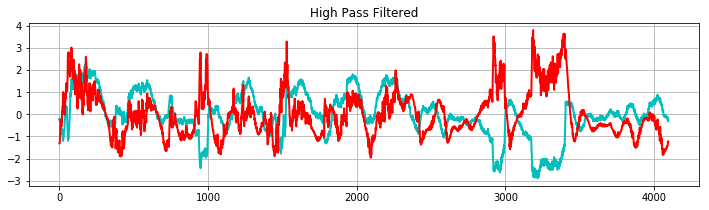

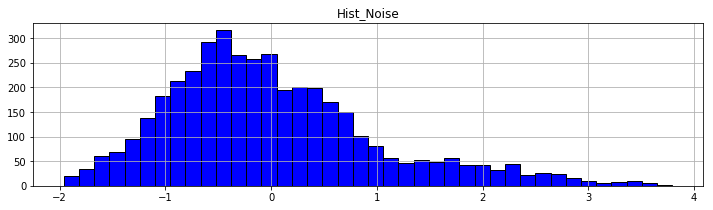

In [0]:
# High Pass Filter
co2_fft = fft(co2_numpy[0:tot_min])
co2_fft_mod = co2_fft
co2_fft_mod[0:limit] = 0
co2_ifft = abs(ifft(co2_fft_mod))
co2_after = co2_ifft - np.mean(co2_ifft)
co2_after = co2_after / np.std(co2_after)

plt.figure(3)
plt.plot(np.arange(tot_min),co2_before ,'c', np.arange(tot_min), co2_after, 'r')
plt.title('High Pass Filtered')

plt.figure(4)
plt.hist(co2_after,bins=40,color='b',edgecolor='black')
plt.title('Hist_Noise')

plt.show()

In [0]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

# First set up the figure, the axis, and the plot element we want to animate
fig, (ax1,ax2) = plt.subplots(2,1, figsize=(10,6))
plt.close()

ax1.set_xlim((0, 30))   ; ax1.set_ylim((-100, 2500))
ax2.set_xlim((0, 1024)) ; ax2.set_ylim((5, 20))

line1, = ax1.plot([], [])
line2, = ax2.plot([], [])

# initialization function: plot the background of each frame
def init():
    line1.set_data([], [])
    line2.set_data([], [])    
    return (line1,line2)

# animation function. This is called sequentially  
def animate(i):
    i = i * 10

    co2_fft = abs(fft(co2_numpy[i:i+1024]))
    x1 = np.arange(30)
    y1 = co2_fft[0:30]
    line1.set_data(x1, y1)

    x2 = np.arange(1024)
    y2 = co2_numpy[i:i+1024]
    line2.set_data(x2, y2)
    return (line1,line2)

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=300, interval=50, blit=True)

# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim

In [0]:
# import random
# from itertools import count
# import pandas as pd
# import matplotlib.pyplot as plt
# from matplotlib.animation import FuncAnimation

# from matplotlib import rc
# from IPython.display import HTML

# x_vals = []
# y_vals = []

# index = count()


# def animate(i):
#     x = np.arange(30)
#     y1 = x*10*i
#     y2 = x*20*i

#     plt.cla()

#     plt.plot(x, y1, label='Channel 1')
#     plt.plot(x, y2, label='Channel 2')

#     plt.legend(loc='upper left')
#     plt.tight_layout()


# ani = FuncAnimation(plt.gcf(), animate, interval=100)

# plt.tight_layout()
# plt.show()

# rc('animation', html='jshtml')
# ani

In [0]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

# First set up the figure, the axis, and the plot element we want to animate
fig, (ax1,ax2) = plt.subplots(2,1, figsize=(10,6))
plt.close()

ax1.set_xlim((0, 30))   ; ax1.set_ylim((-100, 2500))
ax2.set_xlim((0, 1024)) ; ax2.set_ylim((5, 20))

line1, = ax1.plot([], [])
line2, = ax2.plot([], [])

# initialization function: plot the background of each frame
def init():
    line1.set_data([], [])
    line2.set_data([], [])    
    return (line1,line2)

# animation function. This is called sequentially  
def animate(i):
    i = i * 10

    co2_fft = abs(fft(co2_numpy[i:i+1024]))
    x1 = np.arange(30)
    y1 = co2_fft[0:30]
    line1.set_data(x1, y1)

    x2 = np.arange(1024)
    y2 = co2_numpy[i:i+1024]
    line2.set_data(x2, y2)
    return (line1,line2)

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=2, interval=50, blit=True)

# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim